In [1]:
import pandas as pd
from sklearn.preprocessing import MultiLabelBinarizer
import sys
from colorama import Fore, Back, Style
import outlierLibrary
from collections import Counter
import json
import re
from pprint import pprint
import re
import numpy as np
import pandas as pd
import copy
import math
from sklearn.cluster import KMeans
from scipy.spatial import distance
from sklearn import mixture
from sklearn.neighbors import NearestNeighbors
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.ensemble import IsolationForest
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
import time
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


# Reading Input

In [2]:
props = []
datas = []

f = open('datasets/flat-sample/namedStructureProperties_ip-accesslist.json')

count = 0
for line in f:
    try:
        match = re.match('.*:(.*)=>(.*);', line)

        props.append(match.group(1))

        extracted = match.group(2)
        extracted = '[' + extracted + ']'

        data = json.loads(extracted)

        for i in range(len(data)):
            data[i] = str(data[i])
            data[i] = [data[i]]


        datas.append(data)

        count += 1
        # if count == 2:
        #     break
    except:
        continue

# Encoding Data using MultiLabelBinarizer

In [3]:
mlb = MultiLabelBinarizer()

encodedLists = []
frequencyLists = []
uniqueClasses = []
proportion = 0 

# Encoding Data

In [4]:
for i, data in enumerate(datas):
    # fit_transform calculates the size of each category automatically based on the input data
    # and then encodes it into the multilabel bit encoding
    encodedList = mlb.fit_transform(datas[i])
    encodedLists.append(encodedList)
    uniqueClasses.append(mlb.classes_)
    frequencyList = [0] * len(encodedList[0])
    proportion += len(encodedList[0]) * len(encodedList)

    for e in encodedList:
        for i in range(len(e)):
            frequencyList[i] += e[i] 
            
    frequencyLists.append(frequencyList)

# Creating Density Lists

In [5]:
densityLists = []
normalizedDensityLists = []
aggregatedDensityList = [0] * len(encodedLists[0])

for i in range(len(encodedLists)):
    densityList = [0] * len(encodedLists[i])
    normalizedDensityList = [0] * len(encodedLists[i])

    for j in range(len(densityList)):
        for k in range(len(encodedLists[i][j])): 
            densityList[j] += encodedLists[i][j][k] * frequencyLists[i][k]
            normalizedDensityList[j] += encodedLists[i][j][k] * frequencyLists[i][k] / float(proportion)
            aggregatedDensityList[j] += encodedLists[i][j][k] * frequencyLists[i][k]
    densityLists.append(densityList)
    normalizedDensityLists.append(normalizedDensityList)

# Implementation

# Statistical Methods Implementation

## Tukey Method

In [40]:
def tukey(densityList):

    q1 = np.percentile(densityList, 25)
    q3 = np.percentile(densityList, 75)

    iqr = q3 - q1

    lower_distance = q1 - 1.5 * iqr
    upper_distance = q3 + 1.5 * iqr

    outliers = []

    for i, n in enumerate(densityList):
        if n < lower_distance or n > upper_distance:
            outliers.append(i)
    return outliers

## Z-Score

In [8]:
def z_score(densityList):
    mean = np.mean(densityList)
    std = np.std(densityList)

    outliers = []

    for i, n in enumerate(densityList):
        z = (n - mean) / std
        if abs(z) >= 1:
            outliers.append(i)
    return outliers

## Modified Z-Score

In [37]:
def modified_z_score(densityList):
    median = np.median(densityList)
    df = pd.DataFrame()
    df['a'] = densityList
    mad = df['a'].mad()

    outliers = []

    for i, n in enumerate(densityList):
        z = (n - median) / mad
        if abs(z) >= 1:
            outliers.append(i)

    return outliers

## Regression

In [10]:
def regression(points):
    # pointers should be a list of pairs of numbers (tuples)
    n = len(points)
    sum_x = 0.0
    sum_y = 0.0
    sum_xy = 0.0
    sum_x2 = 0.0
    sum_y2 = 0.0

    for i in range(n):
        x = points[i][0]
        y = points[i][1]

        sum_x += x
        sum_y += y
        sum_xy += x * y
        sum_x2 += x * x
        sum_y2 += y * y

    a = (sum_y * sum_x2 - sum_x * sum_xy) / (n * sum_x2 - sum_x * sum_x)
    b = (n * sum_xy - sum_x * sum_y) / (n * sum_x2 - sum_x * sum_x)
    return a, b

In [11]:
def predict(x, a, b):
    y = a + b * x
    return y

## Calculating MSE

In [12]:
def mean_squared_error(points, a, b):

    mse = 0
    for i in range(len(points)):
        prediction = predict(points[i][0], a, b)
        error = prediction - points[i][1]
        mse += error * error

    mse /= len(points)
    return mse

## Cook's Distance

In [13]:
def cooks_distance(points):
    # points should be a list of pairs of numbers (tuples)

    a, b = regression(points)

    outliers = []

    s = mean_squared_error(points, a, b)

    for i in range(len(points)):
        points_missing = copy.deepcopy(points)
        del points_missing[i]

        a_missing, b_missing = regression(points_missing)

        distance = 0

        # print(predict(points[i][0], a, b) - predict(points[i][0], a_missing, b_missing))

        for j in range(len(points)):
            distance += math.pow((predict(points[i][0], a, b) - predict(points[i][0], a_missing, b_missing)), 2)

        distance /= (3 * s)

        # print(distance)

        if distance > 0.05:
            # outliers.append(points[i])
            outliers.append(i)

    return outliers

## Mahalanobis Distance

In [14]:
def mahalanobis_distance(densityLists):

    vectors = []
    for i in range(len(densityLists[0])):
        vector = []

        for j in range(len(densityLists)):
            vector.append(densityLists[j][i]) 
        vectors.append(vector) 

    # calculate average vector
    average_vector = [0] * len(densityLists)
    for vector in vectors:
        for i in range(len(vector)):
            average_vector[i] += vector[i]

    for i in range(len(average_vector)):
        average_vector[i] /= len(vectors)

    # calculate mahalanobis distance for each point
    outliers = []

    try:
        for i, vector in enumerate(vectors):
            combination = np.vstack((vector, average_vector))
            covariance_matrix = np.cov(combination)
            mahalanobis_dist = distance.mahalanobis(vector, average_vector, covariance_matrix)

            if mahalanobis_dist > 200:
                outliers.append(i)
    except:
        print('ERROR: matrices not aligned, no mahalanobis distance outliers')
        pass

    return outliers

# ML Based Techniques

## Inter-Cluster Method

In [15]:
#This is the intercluster distance criteria.
#In this criteria, the minimum distance between the centroids is used as the parameter.
#Optimal value for the weight has to be set.

def read_values_inter_cluster_criteria(main_list):
    debug_flag = 0
    l = []
    dimensions = len(main_list)
    for i in range(len(main_list[0])):
        temp = []
        for j in range(dimensions):
            temp.append(main_list[j][i])
        l.append(temp)
    if(debug_flag == 1):
        print("list of properties is")
        print(l)

    no_clusters = 2
    clf = KMeans(n_clusters = no_clusters)
    clf.fit(l)
    centroids = clf.cluster_centers_
    if(debug_flag == 1):
        print(" Centroids are")
        print(centroids)

    labels = clf.labels_

    if(debug_flag == 1):
        for i in range(len(l)):
            print("coordinate:", l[i], "label:", labels[i], "centroid:", centroids[labels[i]])

    weight = 0.1
    if(debug_flag == 1):
        print("weight is")
        print(weight)
    cluster_distances = []
    for i in range(len(centroids) ):
        j = i + 1
        while(j < len (centroids)):
            cluster_distances.append(distance.euclidean(centroids[i], centroids[j]))
            j = j + 1
    if(debug_flag == 1):
        print("distance between the various clusters is as follows:")
        print(cluster_distances)
        print("minimum inter-cluster distance is")
    min_intercluster_dist = min(cluster_distances)
    if(debug_flag == 1):
        print("minimum distance between the clsuters is")
        print(min_intercluster_dist)
    #weighing parameter
    w = weight
    outliers1 = []
    for i in range(len(l)):
        if(distance.euclidean(l[i], centroids[labels[i]]) > min_intercluster_dist*w ):
            if(debug_flag == 1):
                print("outlier detected at index:", i)
                print("encoded outlier is", l[i])
            outliers1.append(i)


    if(debug_flag == 1):
        print("outliers by inter cluster criteria are ")
        print(outliers1)

    return outliers1

## Intra-Cluster Method

In [16]:
#This is the intracluster distance criteria.
# In this criteria, the minimum distance between the centroid and the own cluster elements is used as the parameter
# Optimal value for the threshold has to be set.

def read_values_intra_cluster_criteria(main_list):
    l = []
    debug_flag = 0
    dimensions = len(main_list)
    for i in range(len(main_list[0])):
        temp = []
        for j in range(dimensions):
            temp.append(main_list[j][i])
        l.append(temp)

    no_clusters = 2
    clf = KMeans(n_clusters=no_clusters)
    clf.fit(l)
    centroids = clf.cluster_centers_
    if(debug_flag == 1):
        print(" Centroids are")
        print(centroids)
    labels = clf.labels_
    if(debug_flag == 1):
        for i in range(len(l)):
            print("coordinate:", l[i], "label:", labels[i], "centroid:", centroids[labels[i]])

    threshold = 0.1
    if(debug_flag == 1):
        print("threshold is")
        print(threshold)
    points_cluster_dist= []
    for i in range(no_clusters):
        points_cluster_dist.append([])
    for i in range(len(l)):
        points_cluster_dist[labels[i]].append( distance.euclidean(l[i], centroids[labels[i]]) )

    outliers2=[]
    for i in range(len(l)):
        mini = min(points_cluster_dist[labels[i]])
        center_dist = distance.euclidean(l[i], centroids[labels[i]])
        if(mini < threshold *center_dist ):
            if(debug_flag == 1):
                print("outlier detected at index:", i)
                print("encoded outlier is", l[i])
            outliers2.append(i)
    if(debug_flag == 1):
        print("outliers by intra-cluster criteria are")
        print(outliers2)
    return outliers2

## Gaussian Mixture Method

In [17]:
def Gaussian(encodedLists):
    #Gaussian Mixture is used for soft clustering. Insted of assigning points to specific classes it assigns probability.
    #The n_components parameter in the Gaussian is used to specify the number of Gaussians.
    concatenated_features = []
    for i in range(len(encodedLists[0])):
        temp = []
        for j in range(len(encodedLists)):
            temp.extend(encodedLists[j][i])    
        concatenated_features.append(temp)   
    
    # print("concateanted feature is")
    # print(concatenated_features)
    clf = mixture.GaussianMixture(n_components=2, covariance_type='full')
    clf.fit(concatenated_features)
    clf.means_
    Z = -clf.score_samples(np.array(concatenated_features))
    return Z

## KNN Method

In [18]:
def KNN(encodedLists):
    concatenated_features = []
    for i in range(len(encodedLists[0])):
        temp = []
        for j in range(len(encodedLists)):
            temp.extend(encodedLists[j][i])    
        concatenated_features.append(temp)   
    
    # print("concateanted feature is")
    # print(concatenated_features)
    nbrs = NearestNeighbors(n_neighbors=2, algorithm='ball_tree').fit(concatenated_features)
    distances, indices = nbrs.kneighbors(concatenated_features)
    print("indices in KNN are")
    print(indices)
    print("distances in KNN are")
    print(distances)

## Random Forest Method

In [19]:
def RandomForests(densityList,encodedLists):
    #First apply an existing outlier detection technique as RandomForests works on supervised data.

    mean = np.mean(densityList)
    std = np.std(densityList)

    outliers = []
    labels = []
    print("In RandomForests method")
    # print("density list is", densityList)

    for i, n in enumerate(densityList):
        z = (n - mean) / std
        if abs(z) >= 1:
            outliers.append(i)
            labels.append(1)
        else:
            labels.append(0)
    # print("labels are", labels)

    concatenated_features = []
    for i in range(len(encodedLists[0])):
        temp = []
        for j in range(len(encodedLists)):
            temp.extend(encodedLists[j][i])    
        concatenated_features.append(temp)   
    
    # print("concateanted feature is")
    # print(concatenated_features)
    
    indices = np.arange(len(labels))
    X_train, X_test, y_train, y_test, idx1, idx2 = train_test_split(concatenated_features, labels, indices, test_size=0.33, random_state=42)
    
    clf = RandomForestClassifier(n_estimators=100, max_depth=2, random_state=0)

    clf.fit(X_train, y_train)
    print("RandomForests predictions are")
    pred = list(clf.predict(X_test))
    print(pred)
    print("Actual classification is")
    print(y_test)
    
    outliers = []
    for i in range(len(pred)):
        if pred[i] == 1:
            outliers.append(idx2[i])
    return outliers

## Isolation Forest Method

In [20]:
def isolationForests(densityList,encodedLists):
    #First apply an existing outlier detection technique as RandomForests works on supervised data.

    mean = np.mean(densityList)
    std = np.std(densityList)

    outliers = []
    labels = []
    print("In RandomForests method")
    # print("density list is", densityList)

    for i, n in enumerate(densityList):
        z = (n - mean) / std
        if abs(z) >= 1:
            outliers.append(i)
            labels.append(1)
        else:
            labels.append(0)
    print("labels are", labels)

    concatenated_features = []
    for i in range(len(encodedLists[0])):
        temp = []
        for j in range(len(encodedLists)):
            temp.extend(encodedLists[j][i])    
        concatenated_features.append(temp)   
    
    # print("concateanted feature is")
    # print(concatenated_features)
    
    indices = np.arange(len(labels))
    X_train, X_test, y_train, y_test, idx1, idx2 = train_test_split(concatenated_features, labels, indices, test_size=0.33, random_state=42)
    clf = IsolationForest(max_samples=100)
                      
    clf.fit(X_train)
    y_pred_train = list(clf.predict(X_train))
    y_pred_test = list(clf.predict(X_test))
    print("isolationForests predictions on train data are")
    print(y_pred_train)
    print("isolationForests predictions on test data are")
    print(y_pred_test)
    
    outliers = []
    for i in range(len(y_pred_test)):
        if y_pred_test[i] == 1:
            outliers.append(idx2[i])
    return outliers

## Naive Bayes Method

In [21]:
def NaiveBayes(densityList,encodedLists):
    #First apply an existing outlier detection technique as Naive Bayes works on supervised data.
    #So, first we are using z-score threshold to train the Naive Bayes Classifier.
    t1=time.time()
    mean = np.mean(densityList)
    std = np.std(densityList)

    outliers = []
    labels = []
    print("In Naive Bayes method")
    #print("density list is", densityList)

    for i, n in enumerate(densityList):
        z = (n - mean) / std
        if abs(z) >= 1:
            outliers.append(i)
            labels.append(1)
        else:
            labels.append(0)
    #print("labels are", labels)

    concatenated_features = []
    for i in range(len(encodedLists[0])):
        temp = []
        for j in range(len(encodedLists)):
            temp.extend(encodedLists[j][i])    
        concatenated_features.append(temp)   
    
    # print("concateanted feature is")
    # print(concatenated_features)

    indices = np.arange(len(labels))
    X_train, X_test, y_train, y_test, idx1, idx2 = train_test_split(concatenated_features, labels, indices, test_size=0.33, random_state=42)

    clf = GaussianNB()
    clf.fit(X_train, y_train)

    print("Naive Bayes predictions are")
    pred = list(clf.predict(X_test))
    print(pred)

    print("Actual classification is")
    print(y_test)

    print("Time taken by NaiveBayes is")
    print(time.time()-t1)
    
    outliers = []
    for i in range(len(pred)):
        if pred[i] == 1:
            outliers.append(idx2[i])
    return outliers

## Logistic Regression Method

In [22]:
def Logistic_Regression(densityList,encodedLists):
    t1 = time.time()
    mean = np.mean(densityList)
    std = np.std(densityList)

    outliers = []
    labels = []
    print("In Logistic Regression method")
    #print("density list is", densityList)

    for i, n in enumerate(densityList):
        z = (n - mean) / std
        if abs(z) >= 1:
            outliers.append(i)
            labels.append(1)
        else:
            labels.append(0)
    #print("labels are", labels)

    concatenated_features = []
    for i in range(len(encodedLists[0])):
        temp = []
        for j in range(len(encodedLists)):
            temp.extend(encodedLists[j][i])    
        concatenated_features.append(temp)   
    
    #print("concateanted feature is")
    #print(concatenated_features)
    
    indices = np.arange(len(labels))
    X_train, X_test, y_train, y_test, idx1, idx2 = train_test_split(concatenated_features, labels, indices, test_size=0.33, random_state=42)

    clf =  LogisticRegression(random_state=0, solver='lbfgs', multi_class='multinomial')
    clf.fit(X_train, y_train)

    print("Logistic Regression predictions are")
    pred = list(clf.predict(X_test))
    print(pred)

    print("Actual classification is")
    print(y_test)

    print("Time taken by Logistic Regression is")
    print(time.time()-t1)
    
    outliers = []
    for i in range(len(pred)):
        if pred[i] == 1:
            outliers.append(idx2[i])
    return outliers

# Calling Methods¶

## ML Based Methods

In [23]:
#Inter-Cluster
outliers = read_values_inter_cluster_criteria(densityLists)
label = 'Inter-cluster distance method outliers: \n' + str(outliers)
print(label)
print('Number of Outliers: {}'.format(len(outliers)))
print()
for outlier in outliers:
    print('Outlier index: %d' % outlier)
    for i, data in enumerate(datas):
        print('\t%s: %s' % (props[i], data[outlier]))
    print()
print()

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [24]:
#Intra-Cluster
outliers = read_values_intra_cluster_criteria(densityLists)
label = 'Intra-cluster distance method outliers: \n' + str(outliers)
print(label)
print('Number of Outliers: {}'.format(len(outliers)))
print()
for outlier in outliers:
    print('Outlier index: %d' % outlier)
    for i, data in enumerate(datas):
        print('\t%s: %s' % (props[i], data[outlier]))
    print()
print()

Intra-cluster distance method outliers: 
[]
Number of Outliers: 0




In [25]:
# Gaussian Mixture Model
likelihood = Gaussian(encodedLists)
print("Likelihood given by G.M.M is\n{}".format(likelihood))
print()

Likelihood given by G.M.M is
[-5821.72704826 -6306.84705937 -5821.72704826 -5821.72895361
 -5821.72704826 -5821.72704826 -5821.72704826 -5821.72910166
 -5821.72704826 -6306.84705937 -5821.72847481 -5821.72910166
 -5821.72910166 -5821.72704826 -5821.72704826 -5821.72910166
 -5821.72910166 -5821.72910166 -5821.72895361 -5821.72910166
 -5821.72910166 -5821.72704826 -5821.72910166 -5821.72910166
 -5821.72910166 -5821.72910166 -5821.72895361 -5821.72910166
 -5821.72910166 -5821.72910166 -5821.72910166 -5821.72910166
 -5821.72895361 -5821.72910166 -5821.72895361 -5821.72847481
 -5821.72910166 -5821.72493574 -5821.72910166 -5821.72910166
 -5821.72910166 -5821.72775969 -5821.72910166 -5821.72910166
 -5821.72704826 -5821.72704826 -5821.72910166 -5821.72895361
 -5821.72895361 -5821.72895361 -5821.72910166 -5821.72910166
 -5821.72704826 -5821.72847481 -5821.72704826 -5821.72847481
 -5821.72910166 -5821.72910166 -5821.72910166 -5821.72895361
 -6306.84705937 -5821.72895361 -5821.72910166 -5821.7291

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


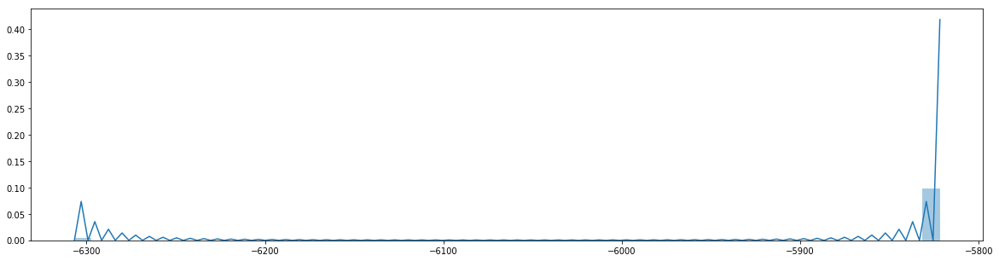

In [26]:
plt.figure(figsize=(20,5))
sns.distplot(likelihood)

In [27]:
# KNN
KNN(encodedLists)
print()

indices in KNN are
[[ 0 73]
 [ 1  9]
 [ 2  6]
 [ 3 18]
 [ 4  5]
 [ 5  4]
 [ 6  2]
 [ 7 96]
 [ 8 54]
 [ 9  1]
 [10 35]
 [11 96]
 [12 96]
 [13 52]
 [14 70]
 [15 96]
 [16 96]
 [17 96]
 [18  3]
 [19 96]
 [20 96]
 [21 45]
 [22 96]
 [23 96]
 [24 96]
 [25 96]
 [26  3]
 [27 96]
 [28 96]
 [29 96]
 [30 96]
 [31 96]
 [32  3]
 [33 96]
 [34  3]
 [35 10]
 [36 96]
 [37 96]
 [38 96]
 [39 96]
 [40 96]
 [41 83]
 [42 96]
 [43 96]
 [44 95]
 [45 21]
 [46 96]
 [47  3]
 [48  3]
 [49  3]
 [50 96]
 [51 96]
 [52 13]
 [53 10]
 [54  8]
 [55 10]
 [56 96]
 [57 96]
 [58 96]
 [59  3]
 [60  1]
 [61  3]
 [62 96]
 [63 96]
 [64 96]
 [65 96]
 [66  3]
 [67 96]
 [68  3]
 [69 96]
 [70 14]
 [71 96]
 [72 96]
 [73  0]
 [74  1]
 [75  3]
 [76  3]
 [77  3]
 [78 96]
 [79 96]
 [80 96]
 [81 47]
 [82  3]
 [83 88]
 [84 47]
 [85 96]
 [86 10]
 [87 10]
 [88 83]
 [89  3]
 [90 96]
 [91 96]
 [92 96]
 [93  3]
 [94 96]
 [95 44]
 [96  7]]
distances in KNN are
[[ 0.          1.41421356]
 [ 0.          1.41421356]
 [ 0.          1.41421356]
 [ 0.

In [28]:
#Naive Bayes
outliers = NaiveBayes(aggregatedDensityList,encodedLists)
print('\nOutliers are')
print(outliers)
print('Number of Outliers: {}'.format(len(outliers)))
print()
for outlier in outliers:
    print('Outlier index: %d' % outlier)
    for i, data in enumerate(datas):
        print('\t%s: %s' % (props[i], data[outlier]))
    print()
print()

In Naive Bayes method
Naive Bayes predictions are
[0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]
Actual classification is
[0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0]
Time taken by NaiveBayes is
0.029172897338867188

Outliers are
[83, 10, 4, 70, 9]
Number of Outliers: 5

Outlier index: 83
	Node: ['st62in82bsce']
	11: ["{'sourceName': '99', 'lines': [{'name': 'permit 126.170.164.59 0.0.15.255', 'action': 'PERMIT', 'matchCondition': {'headerSpace': {'dstIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'srcIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '126.170.160.0/20'}, 'negate': False}, 'class': 'org.batfish.datamodel.acl.MatchHeaderSpace'}}, {'name': 'permit 126.175.60.181 0.0.15.255', 'action': 'PERMIT', 'matchCondition': {'headerSpace': {'dstIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard':

In [29]:
# Logistic Regression
outliers = Logistic_Regression(aggregatedDensityList,encodedLists)
print('\nOutliers are')
print(outliers)
print('Number of Outliers: {}'.format(len(outliers)))
print()
for outlier in outliers:
    print('Outlier index: %d' % outlier)
    for i, data in enumerate(datas):
        print('\t%s: %s' % (props[i], data[outlier]))
    print()
print()

In Logistic Regression method
Logistic Regression predictions are
[0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0]
Actual classification is
[0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0]
Time taken by Logistic Regression is
0.07123899459838867

Outliers are
[81, 83, 10, 0, 44, 4, 73, 70, 9, 95]
Number of Outliers: 10

Outlier index: 81
	Node: ['rt55dxce01']
	11: ["{'sourceName': 'IKE', 'lines': [{'name': 'permit udp any eq isakmp any eq isakmp', 'action': 'PERMIT', 'matchCondition': {'headerSpace': {'dstIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'srcPorts': ['500-500'], 'srcIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'dstPorts': ['500-500'], 'negate': False, 'ipProtocols': ['UDP']}, 'class': 'org.batfish.datamodel.acl.MatchHeaderSpace'}}], 'name': 'IKE', 'sourceType': 'extended ipv4 access-list'}"]

	45: ["{'sourceName': '99', 'lines': [{'name': 'permit 126.182.152.234', 'action': 'PERMIT', 'matchCondition': {'headerSpace': {'dstIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'srcIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '126.182.152.234'}, 'negate': False}, 'class': 'org.batfish.datamodel.acl.MatchHeaderSpace'}}, {'name': 'permit 126.182.155.209', 'action': 'PERMIT', 'matchCondition': {'headerSpace': {'dstIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'srcIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '126.182.155.209'}, 'negate': False}, 'class': 'org.batfish.datamodel.acl.MatchHeaderSpace'}}, {'name': 'permit 126.183.172.226', 'action': 'PERMIT', 'matchCondition': {'headerSpace': {'dstIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'srcIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard'

In [30]:
# Random Forest
outliers = RandomForests(aggregatedDensityList,encodedLists)
print('\nOutliers are')
print(outliers)
print('Number of Outliers: {}'.format(len(outliers)))
print()
for outlier in outliers:
    print('Outlier index: %d' % outlier)
    for i, data in enumerate(datas):
        print('\t%s: %s' % (props[i], data[outlier]))
    print()
print()

In RandomForests method
RandomForests predictions are
[0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0]
Actual classification is
[0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0]

Outliers are
[81, 83, 10, 0, 44, 4, 73, 70, 9, 95]
Number of Outliers: 10

Outlier index: 81
	Node: ['rt55dxce01']
	11: ["{'sourceName': 'IKE', 'lines': [{'name': 'permit udp any eq isakmp any eq isakmp', 'action': 'PERMIT', 'matchCondition': {'headerSpace': {'dstIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'srcPorts': ['500-500'], 'srcIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'dstPorts': ['500-500'], 'negate': False, 'ipProtocols': ['UDP']}, 'class': 'org.batfish.datamodel.acl.MatchHeaderSpace'}}], 'name': 'IKE', 'sourceType': 'extended ipv4 access-list'}"]
	120: ["{'sourceName': 'IKE', 'lines': [{'name': 'permit udp any eq 

	20: ["{'sourceName': '99', 'lines': [{'name': 'permit 126.170.164.59 0.0.15.255', 'action': 'PERMIT', 'matchCondition': {'headerSpace': {'dstIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'srcIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '126.170.160.0/20'}, 'negate': False}, 'class': 'org.batfish.datamodel.acl.MatchHeaderSpace'}}, {'name': 'permit 126.175.60.181 0.0.15.255', 'action': 'PERMIT', 'matchCondition': {'headerSpace': {'dstIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'srcIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '126.175.48.0/20'}, 'negate': False}, 'class': 'org.batfish.datamodel.acl.MatchHeaderSpace'}}, {'name': 'deny any log', 'action': 'DENY', 'matchCondition': {'headerSpace': {'dstIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'srcIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ip

In [31]:
# Isolation Forest
outliers = isolationForests(aggregatedDensityList,encodedLists)
print('\nOutliers are')
print(outliers)
print('Number of Outliers: {}'.format(len(outliers)))
print()
for outlier in outliers:
    print('Outlier index: %d' % outlier)
    for i, data in enumerate(datas):
        print('\t%s: %s' % (props[i], data[outlier]))
    print()
print()

In RandomForests method
labels are [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0]


/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/iforest.py:187: UserWarning: max_samples (100) is greater than the total number of samples (64). max_samples will be set to n_samples for estimation.
  % (self.max_samples, n_samples))
/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


isolationForests predictions on train data are
[1, -1, -1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, -1, 1, 1, 1, 1, 1, 1, 1, -1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, -1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, -1, 1, 1, 1, 1, 1, 1, 1, 1, 1, -1, 1, 1]
isolationForests predictions on test data are
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, -1, 1, 1, 1, 1, 1, -1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Outliers are
[62, 40, 93, 18, 81, 83, 64, 42, 10, 0, 31, 75, 47, 26, 44, 22, 12, 89, 73, 49, 68, 15, 39, 33, 9, 80, 11, 65, 95, 30, 28]
Number of Outliers: 31

Outlier index: 62
	Node: ['st73in54p5as']
	11: ["{'sourceName': '99', 'lines': [{'name': 'permit 126.182.152.234', 'action': 'PERMIT', 'matchCondition': {'headerSpace': {'dstIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'srcIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '126.182.152.234'}, 'negate': False}, 'class': 'org.batfish.datamodel.acl.MatchHeaderSpace'}}, {'name': 'p

	snmpline2: ["{'sourceName': 'IKE', 'lines': [{'name': 'permit udp any eq isakmp any eq isakmp', 'action': 'PERMIT', 'matchCondition': {'headerSpace': {'dstIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'srcPorts': ['500-500'], 'srcIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'dstPorts': ['500-500'], 'negate': False, 'ipProtocols': ['UDP']}, 'class': 'org.batfish.datamodel.acl.MatchHeaderSpace'}}], 'name': 'IKE', 'sourceType': 'extended ipv4 access-list'}"]
	snmpline4: ["{'sourceName': 'IKE', 'lines': [{'name': 'permit udp any eq isakmp any eq isakmp', 'action': 'PERMIT', 'matchCondition': {'headerSpace': {'dstIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'srcPorts': ['500-500'], 'srcIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'dstPorts': ['500-500'], 'negate': False, 'ipProtocols': ['UDP']}, 'class': 'org.batfish.datamode

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


# Statistical Based Methods

In [41]:
# Tukey's method.
outliers = tukey(aggregatedDensityList)
label = 'Tukey\'s method outliers: \n' + str(outliers)
print(label)
print('Number of Outliers: {}'.format(len(outliers)))
for outlier in outliers:
    print("Outlier index: %d" % outlier)
    for i, data in enumerate(datas):
        print("\t%s: %s" % (props[i], data[outlier]))
    print()
print()

Tukey's method outliers: 
[]
Number of Outliers: 0



In [33]:
# Z-Score
outliers = z_score(aggregatedDensityList)
label = 'Z-Score method outliers: \n' + str(outliers)
print(label)
print('Number of Outliers: {}'.format(len(outliers)))
for outlier in outliers:
    print("Outlier index: %d" % outlier)
    for i, data in enumerate(datas):
        print("\t%s: %s" % (props[i], data[outlier]))
    print()
print()

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


	10: ["{'sourceName': 'InterNWOCX', 'lines': [{'name': 'permit ospf any any', 'action': 'PERMIT', 'matchCondition': {'headerSpace': {'dstIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'srcIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'negate': False, 'ipProtocols': ['OSPF']}, 'class': 'org.batfish.datamodel.acl.MatchHeaderSpace'}}, {'name': 'permit tcp any any eq bgp', 'action': 'PERMIT', 'matchCondition': {'headerSpace': {'dstIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'srcIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'ipProtocols': ['TCP'], 'negate': False, 'dstPorts': ['179-179']}, 'class': 'org.batfish.datamodel.acl.MatchHeaderSpace'}}, {'name': 'permit icmp any any', 'action': 'PERMIT', 'matchCondition': {'headerSpace': {'dstIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'srcIps'

In [38]:
# Modified Z-Score
outliers = modified_z_score(aggregatedDensityList)
label = 'Modified Z-Score method outliers: \n' + str(outliers)
print(label)
print('Number of Outliers: {}'.format(len(outliers)))
for outlier in outliers:
    print("Outlier index: %d" % outlier)
    for i, data in enumerate(datas):
        print("\t%s: %s" % (props[i], data[outlier]))
    print()
print()

Modified Z-Score method outliers: 
[7, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 29, 30, 31, 33, 36, 38, 39, 40, 42, 43, 46, 50, 51, 56, 57, 58, 62, 63, 64, 65, 67, 69, 71, 72, 78, 79, 80, 85, 90, 91, 92, 94, 96]
Number of Outliers: 47
Outlier index: 7
	Node: ['st73in91m5as']
	11: ["{'sourceName': '99', 'lines': [{'name': 'permit 126.182.152.234', 'action': 'PERMIT', 'matchCondition': {'headerSpace': {'dstIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'srcIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '126.182.152.234'}, 'negate': False}, 'class': 'org.batfish.datamodel.acl.MatchHeaderSpace'}}, {'name': 'permit 126.182.155.209', 'action': 'PERMIT', 'matchCondition': {'headerSpace': {'dstIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'srcIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '126.182.155.209'}, 'negate': False}, 'class': 'org.batfish.data

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


	20: ["{'sourceName': '99', 'lines': [{'name': 'permit 126.182.152.234', 'action': 'PERMIT', 'matchCondition': {'headerSpace': {'dstIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'srcIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '126.182.152.234'}, 'negate': False}, 'class': 'org.batfish.datamodel.acl.MatchHeaderSpace'}}, {'name': 'permit 126.182.155.209', 'action': 'PERMIT', 'matchCondition': {'headerSpace': {'dstIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'srcIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '126.182.155.209'}, 'negate': False}, 'class': 'org.batfish.datamodel.acl.MatchHeaderSpace'}}, {'name': 'permit 126.183.172.226', 'action': 'PERMIT', 'matchCondition': {'headerSpace': {'dstIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'srcIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard'

In [35]:
# Cook's Method
cooksDensityList = []
for i, value in enumerate(aggregatedDensityList):
    cooksDensityList.append((i, value))

outliers = cooks_distance(cooksDensityList)
label = 'Cook\'s distance method outliers: \n' + str(outliers)
print(label)
print('Number of Outliers: {}'.format(len(outliers)))
for outlier in outliers:
    print("Outlier index: %d" % outlier)
    for i, data in enumerate(datas):
        print("\t%s: %s" % (props[i], data[outlier]))
    print()
print()

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.



	112: ["{'sourceName': '99', 'lines': [{'name': 'permit 126.170.164.59 0.0.15.255', 'action': 'PERMIT', 'matchCondition': {'headerSpace': {'dstIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'srcIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '126.170.160.0/20'}, 'negate': False}, 'class': 'org.batfish.datamodel.acl.MatchHeaderSpace'}}, {'name': 'permit 126.175.60.181 0.0.15.255', 'action': 'PERMIT', 'matchCondition': {'headerSpace': {'dstIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'srcIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '126.175.48.0/20'}, 'negate': False}, 'class': 'org.batfish.datamodel.acl.MatchHeaderSpace'}}, {'name': 'deny any log', 'action': 'DENY', 'matchCondition': {'headerSpace': {'dstIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', 'ipWildcard': '0.0.0.0/0'}, 'srcIps': {'class': 'org.batfish.datamodel.IpWildcardIpSpace', '

In [36]:
# Mahalanobis Method
outliers = mahalanobis_distance(densityLists)
label = 'Malanobis distance method outliers: \n' + str(outliers)
print(label)
print('Number of Outliers: {}'.format(len(outliers)))
for outlier in outliers:
    print("Outlier index: %d" % outlier)
    for i, data in enumerate(datas):
        print("\t%s: %s" % (props[i], data[outlier]))
    print()
print()

ERROR: matrices not aligned, no mahalanobis distance outliers
Malanobis distance method outliers: 
[]
Number of Outliers: 0

